# PyCaret2 AutoML Regression Example

- https://pycaret.org/

> PyCaret is an open-source, low-code machine learning library in Python that aims to reduce the cycle time from hypothesis to insights. It is well suited for seasoned data scientists who want to increase the productivity of their ML experiments by using PyCaret in their workflows or for citizen data scientists and those new to data science with little or no background in coding. PyCaret allows you to go from preparing your data to deploying your model within seconds using your choice of notebook environment.

This notebook is a modified version of the PyCaret 2.0 example notebook
- https://github.com/pycaret/pycaret/blob/master/examples/PyCaret%202%20Regression.ipynb


PyCaret v2.2+ supports GPU training
- https://towardsdatascience.com/pycaret-2-2-is-here-whats-new-ad7612ca63b

In [1]:
%%html
<style> 
table { float:left; margin-bottom: 1em; } 
table + * { content: ""; clear: both; display: table; }
</style>

In [2]:
# !pip3 install -q pycaret[full] 2> /dev/null

zsh:1: no matches found: pycaret[full]


In [2]:
# check version
from pycaret.utils import version
version()

ModuleNotFoundError: No module named 'pycaret'

# Auto EDA

The use of `pandas_profiling.ProfileReport` was inspired by:
- https://www.kaggle.com/rushikeshlavate/perform-eda-automatically

In [4]:
import pandas as pd
path = '/Users/fyenne/Downloads/booooks/semester5/tf24/mar_kaggle/data/train.csv'
data = pd.read_csv(path, index_col='id')
data

,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
id,,,,,,,,,,,,,,,,,,,,,
1,A,B,A,A,B,D,A,E,C,I,...,0.881122,0.421650,0.741413,0.895799,0.802461,0.724417,0.701915,0.877618,0.719903,6.994023
2,B,A,A,A,B,B,A,E,A,F,...,0.440011,0.346230,0.278495,0.593413,0.546056,0.613252,0.741289,0.326679,0.808464,8.071256
3,A,A,A,C,B,D,A,B,C,N,...,0.914155,0.369602,0.832564,0.865620,0.825251,0.264104,0.695561,0.869133,0.828352,5.760456
4,A,A,A,C,B,D,A,E,G,K,...,0.934138,0.578930,0.407313,0.868099,0.794402,0.494269,0.698125,0.809799,0.614766,7.806457
6,A,B,A,A,B,B,A,E,C,F,...,0.382600,0.705940,0.325193,0.440967,0.462146,0.724447,0.683073,0.343457,0.297743,6.868974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499993,A,B,A,C,B,B,A,E,E,L,...,0.269578,0.258655,0.363598,0.300619,0.340516,0.235711,0.383477,0.215227,0.793630,8.343538
499996,A,B,A,C,B,B,A,E,E,L,...,0.197211,0.257024,0.574304,0.227035,0.322583,0.286094,0.324874,0.306933,0.230902,7.851861
499997,A,B,A,C,B,B,A,E,C,M,...,0.449482,0.386172,0.476217,0.135947,0.502730,0.235788,0.316671,0.250286,0.349041,7.600558


In [5]:
%%time
from pandas_profiling import ProfileReport

auto_eda = ProfileReport(data, title="Tabular Data Series - Feb 2021", explorative=True, minimal=False, progress_bar=False)
auto_eda.to_notebook_iframe()  # BUGFIX: https://github.com/pandas-profiling/pandas-profiling/issues/493

CPU times: user 2min 26s, sys: 6.8 s, total: 2min 32s
Wall time: 2min 47s


# 1. Loading Dataset

- https://pycaret.org/get-data/

> All modules in PyCaret can work directly with pandas Dataframe. It can consume the dataframe, Irrespective of how it is loaded in the environment. See the below example of loading a csv file into the notebook using pandas native functionality.
>
> PyCaret also hosts the repository of open source datasets that were used throughout the documentation for demonstration purposes. These are hosted on PyCaret’s github and can also be directly loaded using `pycaret.datasets module`


In [6]:
# from pycaret.datasets import get_data
# data = get_data('insurance')

# 2. Initialize Setup

- https://pycaret.org/setup/

> Depending on the type of experiment you want to perform, one of the six available modules currently supported must be imported in your python environment. Importing a module prepares an environment for specific task. For example, if you have imported the Classification module, the environment will be setup accordingly to perform classification tasks only. 

| S.No	| Module	| How to Import |
|-------|:----------|:--------------|
| 1		| Classification				| from pycaret.classification import * |
| 2		| Regression					| from pycaret.regression import * |
| 3		| Clustering					| from pycaret.clustering import * |
| 4		| Anomaly Detection				| from pycaret.anomaly import * |
| 5		| Natural Language Processing	| from pycaret.nlp import * |
| 6		| Association Rule Mining		| from pycaret.arules import * |



> Note: If you don’t want PyCaret to display the dialogue for confirmation of data types you may pass silent as True within setup to perform a unattended run of experiment. We don’t recommend that unless you are absolutely sure the inference is correct or you have performed the experiment before or you are overwriting data types using numeric_feature and categorical_feature parameter.

In [7]:
%%time
from pycaret.regression import *
reg1 = setup(data, target='target', session_id=42, log_experiment=False, experiment_name='tabular-playground-feb-2021', silent=True, use_gpu=True)

,Description,Value
0,session_id,42
1,Target,target
2,Original Data,"(300000, 25)"
3,Missing Values,False
4,Numeric Features,14
5,Categorical Features,10
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(209999, 67)"


CPU times: user 26.1 s, sys: 1.51 s, total: 27.7 s
Wall time: 29 s


# 3. Compare Baseline

- https://pycaret.org/compare-models/

> This is the first step we recommend in the workflow of any supervised experiment. This function trains all the models in the model library using default hyperparameters and evaluates performance metrics using cross-validation. It returns the trained model object. 


CatBoost, LGBM and XGBoost are the top three contenders. 
- CatBoost has slightly better results, however LGBM is an order of magnitude faster on CPU

In [8]:
%%time
# Slowest CPU Models
# 139s | RMSE = 0.8593 | rf = Random Forest Regressor | 14s on GPU
# 67s  | RMSE = 0.8673 | et = Extra Trees Regressor   | 158s on GPU
# 234s | RMSE = 0.9447 | knn = K Neighbors Regressor  | 0.5s on GPU

# compared_models = compare_models(fold=5, n_select=3, exclude=['rf', 'et', 'knn'])            # CPU
# compared_models = compare_models(fold=5, n_select=5, exclude=['et', 'huber', 'gbr', 'ada'])  # GPU
compared_models = compare_models(fold=5, n_select=5) 

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.7076,0.7166,0.8465,0.0884,0.1026,0.0981,3.6820
xgboost,Extreme Gradient Boosting,0.7096,0.7246,0.8512,0.0783,0.1031,0.0983,2.3680
catboost,CatBoost Regressor,0.7113,0.7261,0.8521,0.0763,0.1033,0.0987,21.4400
gbr,Gradient Boosting Regressor,0.7130,0.7274,0.8529,0.0748,0.1034,0.0990,127.0040
br,Bayesian Ridge,0.7184,0.7455,0.8634,0.0517,0.1047,0.0998,1.4800
lr,Linear Regression,0.7184,0.7456,0.8635,0.0516,0.1047,0.0998,0.4260
ridge,Ridge Regression,0.7184,0.7456,0.8635,0.0516,0.1047,0.0998,0.0860
huber,Huber Regressor,0.7162,0.7477,0.8647,0.0490,0.1050,0.0999,17.4280
et,Extra Trees Regressor,0.7202,0.7506,0.8664,0.0452,0.1049,0.0998,197.5660
omp,Orthogonal Matching Pursuit,0.7266,0.7604,0.8720,0.0327,0.1057,0.1009,0.6440


CPU times: user 24min 36s, sys: 1min 21s, total: 25min 58s
Wall time: 39min 34s


# 4. Create Model

- https://pycaret.org/create-model/


> Creating a model in any module is as simple as writing create_model. It takes only one parameter i.e. the Model ID as a string. For supervised modules (classification and regression) this function returns a table with k-fold cross validated performance metrics along with the trained model object. For unsupervised module For unsupervised module clustering, it returns performance metrics along with trained model object and for remaining unsupervised modules anomaly detection, natural language processing and association rule mining, it only returns trained model object. The evaluation metrics used are:
>
> - Classification: Accuracy, AUC, Recall, Precision, F1, Kappa, MCC
> - Regression: MAE, MSE, RMSE, R2, RMSLE, MAPE
>
> The number of folds can be defined using fold parameter within create_model function. By default, the fold is set to 10. All the metrics are rounded to 4 decimals by default by can be changed using round parameter within create_model. Although there is a separate function to ensemble the trained model, however there is a quick way available to ensemble the model while creating by using ensemble parameter along with method parameter within create_model function.

In [7]:
%%time
Settings from previus tune_model()
lightgbm = create_model('lightgbm', 
    bagging_fraction=0.7, bagging_freq=7, boosting_type='gbdt',
    class_weight=None, colsample_bytree=1.0, device='gpu',
    feature_fraction=0.5, importance_type='split',
    learning_rate=0.071, max_depth=-1, min_child_samples=70,
    min_child_weight=0.001, min_split_gain=0.8, n_estimators=150,
    n_jobs=-1, num_leaves=100, objective=None, random_state=42,
    reg_alpha=5, reg_lambda=0.15, silent=True, subsample=1.0,
    subsample_for_bin=200000, subsample_freq=0
)
print()


CPU times: user 18 µs, sys: 7 µs, total: 25 µs
Wall time: 23.1 µs


In [10]:
%%time
catboost = create_model('catboost', 
 depth = 8,
 l2_leaf_reg = 4,
 loss_function = 'RMSE',
 border_count = 32,
 random_strength = 0.7,
 task_type = 'GPU',
 n_estimators = 290,
)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7109,0.7241,0.8510,0.0733,0.1030,0.0985
1,0.7177,0.7408,0.8607,0.0673,0.1045,0.0998
2,0.7115,0.7243,0.8510,0.0721,0.1029,0.0984
3,0.7156,0.7351,0.8574,0.0741,0.1041,0.0997
4,0.7099,0.7230,0.8503,0.0704,0.1033,0.0987
5,0.7158,0.7342,0.8569,0.0724,0.1039,0.0994
6,0.7132,0.7298,0.8543,0.0702,0.1036,0.0990
7,0.7097,0.7191,0.8480,0.0810,0.1025,0.0981
8,0.7153,0.7349,0.8572,0.0719,0.1038,0.0992
9,0.7115,0.7255,0.8518,0.0728,0.1033,0.0989


CPU times: user 39.3 s, sys: 15.6 s, total: 54.8 s
Wall time: 35.6 s


In [11]:
%%time
xgboost = create_model('xgboost',
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=0.5, gamma=0, gpu_id=0,
    importance_type='gain', interaction_constraints='',
    learning_rate=0.274, max_delta_step=0, max_depth=3,
    min_child_weight=3, monotone_constraints='()',
    n_estimators=200, n_jobs=-1, num_parallel_tree=1,
    objective='reg:squarederror', reg_alpha=0.7,
    reg_lambda=0.15, scale_pos_weight=48.30000000000001, subsample=0.7,
    tree_method='gpu_hist', validate_parameters=1, verbosity=0                      
)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7047,0.7109,0.8432,0.0902,0.1020,0.0975
1,0.7102,0.7262,0.8522,0.0857,0.1034,0.0986
2,0.7036,0.7094,0.8423,0.0911,0.1017,0.0972
3,0.7081,0.7187,0.8477,0.0948,0.1029,0.0985
4,0.7029,0.7073,0.8410,0.0906,0.1021,0.0976
5,0.7087,0.7184,0.8476,0.0925,0.1027,0.0983
6,0.7057,0.7140,0.8450,0.0904,0.1024,0.0978
7,0.7014,0.7043,0.8392,0.0999,0.1013,0.0969
8,0.7084,0.7205,0.8488,0.0900,0.1028,0.0981
9,0.7036,0.7103,0.8428,0.0922,0.1022,0.0976


CPU times: user 15.5 s, sys: 945 ms, total: 16.4 s
Wall time: 14 s


In [12]:
%%time
bayesian_ridge = create_model('br',
    alpha_1=0.05, alpha_2=0.0005, alpha_init=None,
    compute_score=False, copy_X=True, fit_intercept=True,
    lambda_1=0.2, lambda_2=0.0005, lambda_init=None, n_iter=300,
    normalize=False, tol=0.001, verbose=False
)

CPU times: user 28.8 s, sys: 2.73 s, total: 31.5 s
Wall time: 18.5 s


In [13]:
# %%time
# import numpy as np
# lgbms = [create_model('lightgbm', learning_rate=i) for i in np.arange(0.1,1,0.2)]
# # print('len(lgbms)', len(lgbms))

In [14]:
# %%time
# catboosts = [create_model('catboost', learning_rate=i) for i in np.arange(0.1,1,0.2)]
# # print('len(catboosts)', len(catboosts))

# 5. Tune Hyperparameters

- https://pycaret.org/tune-model/


> Tuning hyperparameters of a machine learning model in any module is as simple as writing tune_model. It tunes the hyperparameter of the model passed as an estimator using Random grid search with pre-defined grids that are fully customizable. Optimizing the hyperparameters of a model requires an objective function which is linked to target variable automatically in supervised experiments such as Classification or Regression. However for unsupervised experiments such as Clustering, Anomaly Detection and Natural Language Processing PyCaret allows you to define custom objective function by specifying supervised target variable using supervised_target parameter within tune_model (see examples below). For supervised learning, this function returns a table with k-fold cross validated scores of common evaluation metrics along with trained model object. For unsupervised learning, this function only returns trained model object. The evaluation metrics used for supervised learning are:
>
> - Classification: Accuracy, AUC, Recall, Precision, F1, Kappa, MCC
> - Regression: MAE, MSE, RMSE, R2, RMSLE, MAPE
>
> The number of folds can be defined using fold parameter within tune_model function. By default, the fold is set to 10. All the metrics are rounded to 4 decimals by default by can be changed using round parameter. Tune model function in PyCaret is a randomized grid search of a pre-defined search space hence it relies on number of iterations of search space. By default, this function performs 10 random iteration over search space which can be changed using n_iter parameter within tune_model. Increasing the n_iter parameter may increase the training time but often results in a highly optimized model. Metric to be optimized can be defined using optimize parameter. By default, Regression tasks will optimize R2 and Classification tasks will optimize Accuracy. 


In [15]:
# %%time
# lightgbm = tune_model(lightgbm, n_iter=50, optimize='RMSE')
# lightgbm

In [16]:
# %%time
# catboost = tune_model(catboost, n_iter=50, optimize='RMSE')
# catboost.get_params()

In [17]:
# %%time
# xgboost = tune_model(xgboost, n_iter=50, optimize='RMSE')
# xgboost

In [18]:
# %%time
# bayesian_ridge = tune_model(bayesian_ridge, n_iter=50, optimize='RMSE')
# bayesian_ridge

# 6. Ensemble Model

- https://pycaret.org/ensemble-model/

> Ensembling a trained model is as simple as writing ensemble_model. It takes only one mandatory parameter i.e. the trained model object. This functions returns a table with k-fold cross validated scores of common evaluation metrics along with trained model object. The evaluation metrics used are:

> - Classification: Accuracy, AUC, Recall, Precision, F1, Kappa, MCC
> - Regression: MAE, MSE, RMSE, R2, RMSLE, MAPE

> The number of folds can be defined using fold parameter within ensemble_model function. By default, the fold is set to 10. All the metrics are rounded to 4 decimals by default by can be changed using round parameter. There are two methods available for ensembling that can be set using method parameter within ensemble_model function. Both the methods require re-sampling of the data and fitting multiple estimators, hence the number of estimators can be controlled using n_estimators parameter. By default, n_estimators is set to 10.

> This function is only available in pycaret.classification and pycaret.regression modules.


> **Bagging:**
> Bagging, also known as Bootstrap aggregating, is a machine learning ensemble meta-algorithm designed to improve the stability and accuracy of machine learning algorithms used in statistical classification and regression. It also reduces variance and helps to avoid overfitting. Although it is usually applied to decision tree methods, it can be used with any type of method. Bagging is a special case of the model averaging approach.

 
> **Boosting:**
> Boosting is an ensemble meta-algorithm for primarily reducing bias and variance in supervised learning. Boosting is in the family of machine learning algorithms that convert weak learners to strong ones. A weak learner is defined to be a classifier that is only slightly correlated with the true classification (it can label examples better than random guessing). In contrast, a strong learner is a classifier that is arbitrarily well-correlated with the true classification.

In [19]:
%%time
dt        = create_model('dt')
bagged_dt = ensemble_model(dt, n_estimators=10, optimize='RMSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7377,0.8016,0.8953,-0.0259,0.1081,0.1019
1,0.7442,0.8150,0.9028,-0.0260,0.1093,0.1032
2,0.7394,0.8025,0.8958,-0.0282,0.1080,0.1020
3,0.7417,0.8088,0.8993,-0.0188,0.1089,0.1031
4,0.7369,0.7987,0.8937,-0.0269,0.1082,0.1022
5,0.7453,0.8150,0.9028,-0.0296,0.1091,0.1033
6,0.7460,0.8143,0.9024,-0.0374,0.1091,0.1033
7,0.7391,0.7975,0.8930,-0.0193,0.1076,0.1019
8,0.7441,0.8133,0.9019,-0.0272,0.1090,0.1029
9,0.7407,0.8043,0.8968,-0.0279,0.1085,0.1026


CPU times: user 13min 5s, sys: 2.42 s, total: 13min 7s
Wall time: 13min 9s


In [20]:
%%time
bagged_lightgbm = ensemble_model(lightgbm, method='Bagging', n_estimators=10, optimize='RMSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7041,0.7087,0.8418,0.0930,0.1019,0.0974
1,0.7097,0.7229,0.8502,0.0899,0.1032,0.0986
2,0.7036,0.7076,0.8412,0.0934,0.1016,0.0972
3,0.7075,0.7166,0.8466,0.0973,0.1027,0.0984
4,0.7025,0.7056,0.8400,0.0928,0.1020,0.0976
5,0.7082,0.7164,0.8464,0.0949,0.1026,0.0983
6,0.7055,0.7117,0.8436,0.0933,0.1022,0.0978
7,0.7012,0.7011,0.8373,0.1039,0.1011,0.0969
8,0.7081,0.7187,0.8478,0.0923,0.1026,0.0981
9,0.7044,0.7096,0.8424,0.0931,0.1021,0.0978


CPU times: user 28min 13s, sys: 48.6 s, total: 29min 1s
Wall time: 15min 59s


In [21]:
%%time
bagged_catboost = ensemble_model(catboost, method='Bagging', n_estimators=10, optimize='RMSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7119,0.7257,0.8519,0.0712,0.1032,0.0987
1,0.7185,0.7417,0.8612,0.0662,0.1046,0.0999
2,0.7122,0.7248,0.8514,0.0714,0.1029,0.0985
3,0.7163,0.7362,0.8580,0.0727,0.1042,0.0998
4,0.7106,0.7238,0.8508,0.0693,0.1033,0.0988
5,0.7162,0.7348,0.8572,0.0718,0.1040,0.0995
6,0.7139,0.7307,0.8548,0.0691,0.1037,0.0991
7,0.7108,0.7209,0.8490,0.0787,0.1026,0.0983
8,0.7163,0.7361,0.8580,0.0703,0.1039,0.0993
9,0.7126,0.7271,0.8527,0.0707,0.1035,0.0990


CPU times: user 6min 31s, sys: 2min 32s, total: 9min 3s
Wall time: 5min 48s


In [22]:
%%time
bagged_xgboost = ensemble_model(xgboost, method='Bagging', n_estimators=10, optimize='RMSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7034,0.7079,0.8414,0.0940,0.1018,0.0973
1,0.7096,0.7236,0.8506,0.0891,0.1033,0.0986
2,0.7030,0.7074,0.8411,0.0937,0.1016,0.0971
3,0.7070,0.7156,0.8459,0.0986,0.1027,0.0984
4,0.7017,0.7046,0.8394,0.0941,0.1019,0.0975
5,0.7076,0.7157,0.8460,0.0958,0.1025,0.0982
6,0.7048,0.7111,0.8433,0.0940,0.1022,0.0977
7,0.7006,0.7016,0.8376,0.1033,0.1012,0.0968
8,0.7074,0.7177,0.8472,0.0935,0.1026,0.0980
9,0.7035,0.7087,0.8418,0.0943,0.1020,0.0976


CPU times: user 1min 58s, sys: 9.96 s, total: 2min 8s
Wall time: 1min 43s


# 7. Blend Models

- https://pycaret.org/blend-models/


> Blending models is a method of ensembling which uses consensus among estimators to generate final predictions. The idea behind blending is to combine different machine learning algorithms and use a majority vote or the average predicted probabilities in case of classification to predict the final outcome. Blending models in PyCaret is as simple as writing blend_models. This function can be used to blend specific trained models that can be passed using estimator_list parameter within blend_models or if no list is passed, it will use all the models in model library. In case of Classification, method parameter can be used to define ‘soft‘ or ‘hard‘ where soft uses predicted probabilities for voting and hard uses predicted labels. This functions returns a table with k-fold cross validated scores of common evaluation metrics along with trained model object. The evaluation metrics used are:

> - Classification: Accuracy, AUC, Recall, Precision, F1, Kappa, MCC
> - Regression: MAE, MSE, RMSE, R2, RMSLE, MAPE

> The number of folds can be defined using fold parameter within blend_models function. By default, the fold is set to 10. All the metrics are rounded to 4 decimals by default by can be changed using round parameter within blend_models.

> This function is only available in pycaret.classification and pycaret.regression modules.

In [23]:
# %%time
# blender = blend_models(optimize='RMSE', estimator_list=[
#     bayesian_ridge,
#     lightgbm,
#     catboost,
#     xgboost,
#     bagged_lightgbm,
#     bagged_catboost,
#     bagged_xgboost,
#     bagged_dt,
# ])

# 8. Stack Models

- https://pycaret.org/stack-models/

> Stacking models is method of ensembling that uses meta learning. The idea behind stacking is to build a meta model that generates the final prediction using the prediction of multiple base estimators. Stacking models in PyCaret is as simple as writing stack_models. This function takes a list of trained models using estimator_list parameter. All these models form the base layer of stacking and their predictions are used as an input for a meta model that can be passed using meta_model parameter. If no meta model is passed, a linear model is used by default. In case of Classification, method parameter can be used to define ‘soft‘ or ‘hard‘ where soft uses predicted probabilities for voting and hard uses predicted labels. This function returns a table with k-fold cross validated scores of common evaluation metrics along with trained model object. The evaluation metrics used are:

> - Classification: Accuracy, AUC, Recall, Precision, F1, Kappa, MCC
> - Regression: MAE, MSE, RMSE, R2, RMSLE, MAPE

> The number of folds can be defined using fold parameter within stack_models function. By default, the fold is set to 10. All the metrics are rounded to 4 decimals by default by can be changed using round parameter within stack_models. restack parameter controls the ability to expose the raw data to meta model. By default, it is set to True. When changed to False, meta-model will only use predictions of base models to generate final predictions.

 
> **Multiple Layer Stacking**
> Base models can be in a single layer or in multiple layers in which case the predictions from each preceding layer is passed to the next layer as an input until it reaches meta-model where predictions from all the layers including base layer is used as an input to generate final prediction. To stack models in multiple layers, create_stacknet function accepts estimator_list parameters as a list within list. All other parameters are the same. See the below regression example use of the create_stacknet function.

> This function is only available in pycaret.classification and pycaret.regression modules.

> WARNING : This function will be deprecated in future release of PyCaret 2.x.

In [24]:
%%time
# stacker = stack_models(estimator_list = compare_models(n_select=5, fold=5, whitelist=models(type='ensemble').index.tolist()))
stacker = stack_models(estimator_list=[
    bayesian_ridge,
    lightgbm,
    catboost,
    xgboost,
    bagged_lightgbm,
    bagged_catboost,
    bagged_xgboost,
    bagged_dt,
])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7029,0.7073,0.8410,0.0949,0.1017,0.0972
1,0.7087,0.7223,0.8499,0.0907,0.1032,0.0984
2,0.7022,0.7062,0.8403,0.0953,0.1015,0.0970
3,0.7063,0.7149,0.8455,0.0996,0.1026,0.0982
4,0.7013,0.7039,0.8390,0.0949,0.1018,0.0974
5,0.7070,0.7146,0.8453,0.0973,0.1024,0.0981
6,0.7040,0.7098,0.8425,0.0957,0.1021,0.0976
7,0.7000,0.7003,0.8369,0.1049,0.1011,0.0967
8,0.7068,0.7169,0.8467,0.0946,0.1025,0.0979
9,0.7028,0.7078,0.8413,0.0955,0.1020,0.0975


CPU times: user 8h 25min 41s, sys: 41min 11s, total: 9h 6min 53s
Wall time: 6h 2min 27s


# 11. AutoML()

- https://pycaret.org/automl/

> This function returns the best model out of all models created in the current active environment based on metric defined in optimize parameter. Run this code at the end of  your script.




In [25]:
%%time
best = automl(optimize='RMSE')
best

CPU times: user 48min 7s, sys: 3min 42s, total: 51min 50s
Wall time: 34min 37s


StackingRegressor(cv=KFold(n_splits=10, random_state=42, shuffle=False),
                  estimators=[('br',
                               BayesianRidge(alpha_1=0.05, alpha_2=0.0005,
                                             alpha_init=None,
                                             compute_score=False, copy_X=True,
                                             fit_intercept=True, lambda_1=0.2,
                                             lambda_2=0.0005, lambda_init=None,
                                             n_iter=300, normalize=False,
                                             tol=0.001, verbose=False)),
                              ('lightgbm',
                               LGBMRegressor(bagging_fraction=0.7,
                                             bagging...
                                                bootstrap_features=False,
                                                max_features=1.0,
                                                max_samples=1.

# 9. Analyze Model

- https://pycaret.org/plot-model/

> Analyzing performance of trained machine learning model is an integral step in any machine learning workflow. Analyzing model performance in PyCaret is as simple as writing plot_model. The function takes trained model object and type of plot as string within plot_model function.

| Name	| Plot |
|:-------|------:|
| Area Under the Curve	| ‘auc’ | 
| Discrimination Threshold	| ‘threshold’ |
| Precision Recall Curve	| ‘pr’ |
| Confusion Matrix	| ‘confusion_matrix’ |
| Class Prediction Error	| ‘error’ |
| Classification Report	| ‘class_report’ |
| Decision Boundary	| ‘boundary’ |
| Recursive Feature Selection	| ‘rfe’ |
| Learning Curve	| ‘learning’ |
| Manifold Learning	| ‘manifold’ |
| Calibration Curve	| ‘calibration’ |
| Validation Curve	| ‘vc’ |
| Dimension Learning	| ‘dimension’ |
| Feature Importance	| ‘feature’ |
| Model Hyperparameter	| ‘parameter’ |

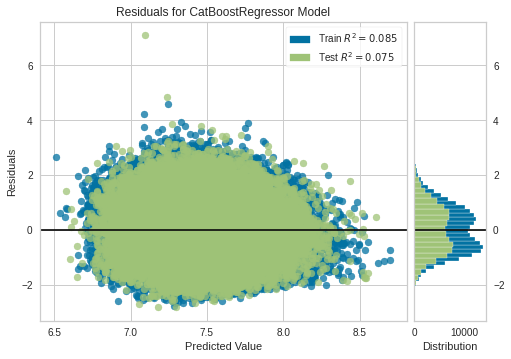

CPU times: user 3min 28s, sys: 3.59 s, total: 3min 32s
Wall time: 2min 1s


In [26]:
%%time
plot_model(best)
plot_model(catboost)

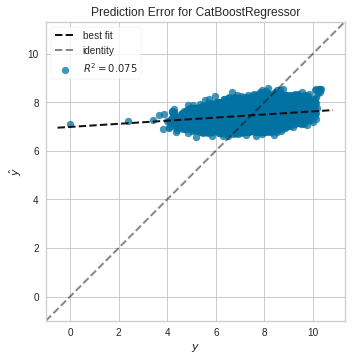

CPU times: user 1min 6s, sys: 775 ms, total: 1min 7s
Wall time: 39.2 s


In [27]:
%%time
plot_model(best, plot='error')
plot_model(catboost, plot='error')

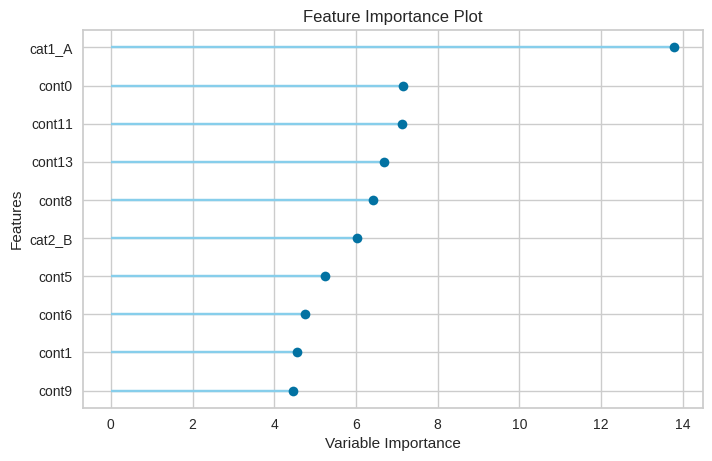

CPU times: user 440 ms, sys: 23.8 ms, total: 464 ms
Wall time: 455 ms


In [28]:
%%time
plot_model(catboost, plot='feature')

In [29]:
%%time
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

CPU times: user 3.07 s, sys: 119 ms, total: 3.18 s
Wall time: 2.02 s


# 10. Interpret Model

- https://pycaret.org/interpret-model/

> Interpreting complex models are of fundamental importance in machine learning. Model Interpretability helps debug the model by analyzing what the model really thinks is important. Interpreting models in PyCaret is as simple as writing interpret_model. The function takes trained model object and type of plot as string. Interpretations are implemented based on the SHAP (SHapley Additive exPlanations) and is only available for tree-based models.

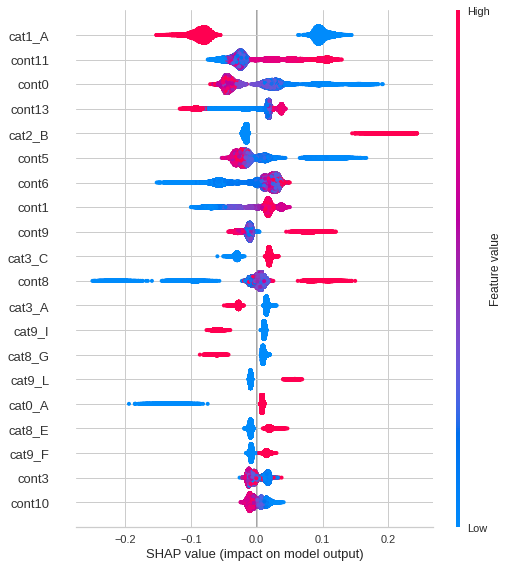

CPU times: user 52.8 s, sys: 989 ms, total: 53.7 s
Wall time: 43.7 s


In [30]:
%%time
interpret_model(catboost)

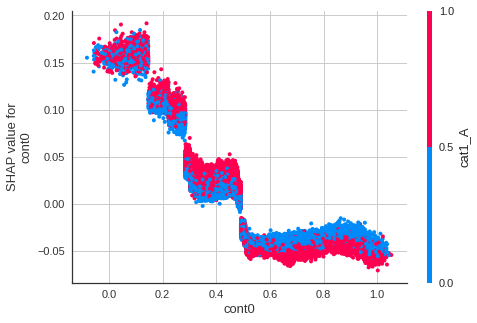

CPU times: user 38 s, sys: 310 ms, total: 38.3 s
Wall time: 23.3 s


In [31]:
%%time
interpret_model(catboost, plot='correlation')

In [32]:
%%time
interpret_model(catboost, plot='reason', observation=12)

CPU times: user 36.5 s, sys: 329 ms, total: 36.8 s
Wall time: 22.1 s


# 12. Predict Model

- https://pycaret.org/predict-model/

> Once a model is successfully deployed either on cloud using deploy_model or locally using save_model, it can be used to predict on unseen data using predict_model function. This functions takes a trained model object and the dataset to predict. It will automatically apply the entire transformation pipeline created during the experiment. For classification, predicted labels are created based on 50% probability, but if you choose to use a different threshold that you may have obtained using optimize_threshold, you can pass the probability_threshold parameter within predict_model. This function can also be used to generate predictions on hold-out / test set.

In [33]:
%%time
pred_holdouts = predict_model(best)
pred_holdouts.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.7052,0.7120,0.8438,0.0986,0.1025,0.0979


CPU times: user 27.2 s, sys: 1.12 s, total: 28.3 s
Wall time: 29.1 s


,cont0,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,...,cat9_H,cat9_I,cat9_J,cat9_K,cat9_L,cat9_M,cat9_N,cat9_O,target,Label
0,0.517321,0.649070,0.495282,0.407344,0.281229,0.377936,0.695889,0.225072,0.279877,0.397533,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.733432,7.274094
1,0.311191,0.049718,0.518400,0.157790,0.298866,0.398920,0.541013,0.261724,0.300421,0.210114,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,6.990234,7.269998
2,0.869850,0.678942,0.734321,0.209937,0.277330,0.835373,0.328593,0.777681,0.266530,0.654293,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,8.212900,7.480606
3,0.347573,0.131831,0.315201,0.745363,0.419922,0.745390,0.384305,0.251359,0.249770,0.334739,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.466549,7.465708
4,0.424749,0.696019,0.949583,0.424285,0.411343,0.227085,0.367200,0.271663,0.302262,0.316547,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7.449541,7.452680


In [34]:
%%time
# new_data = data.copy()
# new_data.drop(['charges'], axis=1, inplace=True)

new_data = pd.read_csv('../input/tabular-playground-series-feb-2021/test.csv', index_col='id')
predict_new = predict_model(best, data=new_data)
predict_new.head()

CPU times: user 1min, sys: 1.58 s, total: 1min 2s
Wall time: 57.6 s


,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,Label
id,,,,,,,,,,,,,,,,,,,,,
0,A,B,A,C,B,D,A,E,E,G,...,0.595507,0.286912,0.279884,0.202234,0.242654,0.285147,0.264308,0.653654,0.302448,7.716073
5,A,B,A,C,B,D,A,E,C,L,...,0.479552,0.397436,0.476742,0.857073,0.516393,0.562065,0.730542,0.318492,0.736251,7.801446
15,A,B,A,C,B,D,A,E,C,F,...,0.676395,0.695284,0.253316,0.586934,0.548555,0.836193,0.759788,0.333572,0.273905,7.565046
16,A,A,B,A,B,D,A,E,E,F,...,0.759875,0.240049,0.298074,0.442475,0.596746,0.414131,0.255382,0.589080,0.311625,7.442735
17,A,B,A,A,B,B,A,E,E,I,...,0.210232,0.329851,0.616663,0.170475,0.263235,0.710961,0.224045,0.285860,0.794931,7.243145


In [35]:
submission_df = pd.read_csv('../input/tabular-playground-series-feb-2021/sample_submission.csv', index_col='id')
submission_df['target'] = predict_new['Label']
submission_df.to_csv('submission.csv')
!head submission.csv

id,target
0,7.716072595144638
5,7.801445641089813
15,7.565046482488313
16,7.442734610690437
17,7.243144784227354
19,7.3835114646178965
20,7.201760476287333
21,7.758325445322839
23,7.260363104824876


# 13. Save / Load Model

- https://pycaret.org/save-model/

> Saving a trained model in PyCaret is as simple as writing save_model. The function takes a trained model object and saves the entire transformation pipeline and trained model object as a transferable binary pickle file for later use.

In [36]:
save_model(best, model_name='best-model')

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='target',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy...
                                                                  max_features=1.0,
                                                                  max_samples=1.0,
                                                                  n_estimators=10,
                                                               

In [37]:
loaded_bestmodel = load_model('best-model')
print(loaded_bestmodel)

Transformation Pipeline and Model Successfully Loaded
Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='target',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy...
                                                                 max_features=1.0,
                                                                 max_samples=1.0,
                                                                 n_estimators=10,
                        

In [38]:
from sklearn import set_config
set_config(display='diagram')
loaded_bestmodel[0]

DataTypes_Auto_infer(categorical_features=[], display_types=False,
                     features_todrop=[], id_columns=[], ml_usecase='regression',
                     numerical_features=[], target='target', time_features=[])

In [39]:
from sklearn import set_config
set_config(display='text')

# 14. Deploy Model

- https://pycaret.org/deploy-model/

> Once a model is finalized using finalize_model, it’s ready for deployment. A trained model can be consumed locally using save_model functionality which save the transformation pipeline and trained model which can be consumed by end user applications as a binary pickle file. Alternatively, models can be deployed on cloud using PyCaret. Deploying a model on cloud is as simple as writing deploy_model.

In [40]:
# deploy_model(best, model_name = 'best-aws', authentication = {'bucket' : 'pycaret-test'})

# 15. Get Config / Set Config

- https://pycaret.org/get-config/
- https://pycaret.org/set-config/

> These functiona are used to access global environment variables.

In [41]:
# X_train = get_config('X_train')
# X_train.head()

In [42]:
# get_config('seed')

In [43]:
# from pycaret.regression import set_config
# set_config('seed', 999)

In [44]:
# get_config('seed')

# 16. MLFlow UI

- https://pycaret.org/mlflow/

> PyCaret 2.0 embeds MLflow Tracking component as a backend API and UI for logging parameters, code versions, metrics, and output files when running your machine learning code and for later visualizing the results. To start logging your experiments set log_experiment parameter within setup to True and defines experiment name using experiment_name parameter.

In [45]:
# !mlflow ui

# End
> Thank you. For more information / tutorials on PyCaret, please visit https://www.pycaret.org

# Further Reading

This notebook is part of a series exploring:

[Tabular Playground - Jan 2021](https://www.kaggle.com/c/tabular-playground-series-jan-2021)
- 0.72746 / 0.72935 - [scikit-learn Ensemble](https://www.kaggle.com/jamesmcguigan/tabular-playground-scikit-learn-ensemble)
- 0.71552 / 0.71659 - [Fast.ai Tabular Solver](https://www.kaggle.com/jamesmcguigan/fast-ai-tabular-solver)
- 0.70317 / 0.70426 - [XGBoost](https://www.kaggle.com/jamesmcguigan/tabular-playground-xgboost)
- 0.70011 / 0.70181 - [LightGBM](https://www.kaggle.com/jamesmcguigan/tabular-playground-lightgbm)

[Tabular Playground - Feb 2021](https://www.kaggle.com/c/tabular-playground-series-feb-2021)
- 0.84452 - [PyCaret2 AutoML Regression](https://www.kaggle.com/jamesmcguigan/tps-pycaret2-automl-regression)

If you enjoyed this notebook, please upvote!